# Introducción al Aprendizaje Automático 2: Aprendizaje supervisado

## Preambulo

In [34]:
%matplotlib inline
import numpy as np
import pandas as pd
import seaborn as sn
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier

np.set_printoptions(precision=2)

frutas = pd.read_table('frutas_con_colores.txt')

caracteristicas_frutas = ['alto', 'ancho', 'masa', 'color']
X_frutas = frutas[caracteristicas_frutas]
y_frutas = frutas['etiqueta_fruta']
nombres_frutas = ['manzana', 'mandarina', 'naranja', 'limon']

X_frutas_2d = frutas[['alto', 'ancho']]
y_frutas_2d = frutas['etiqueta_fruta']


X_train, X_test, y_train, y_test = train_test_split(X_frutas, y_frutas, random_state=0)

from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
X_train_scaled = scaler.fit_transform(X_train)
# tenemos que escalar los datos del conjunto de prueba de la misma manera que calculamos para el entrenamiento
X_test_scaled = scaler.transform(X_test)

knn = KNeighborsClassifier(n_neighbors = 5)
knn.fit(X_train_scaled, y_train)
print('Exactitud del clasificador K-NN en el conjunto de entrenamiento: {:.2f}'
     .format(knn.score(X_train_scaled, y_train)))
print('Exactitud del clasificador K-NN en el conjunto de prueba: {:.2f}'
     .format(knn.score(X_test_scaled, y_test)))

ejemplo_fruta = [[5.5, 2.2, 10, 0.70]]
print('El tipo de fruta para ', ejemplo_fruta, ' es ', 
      nombres_frutas[knn.predict(ejemplo_fruta)[0]-1])

Exactitud del clasificador K-NN en el conjunto de entrenamiento: 0.95
Exactitud del clasificador K-NN en el conjunto de prueba: 1.00
El tipo de fruta para  [[5.5, 2.2, 10, 0.7]]  es  naranja


## Conjutos de datos

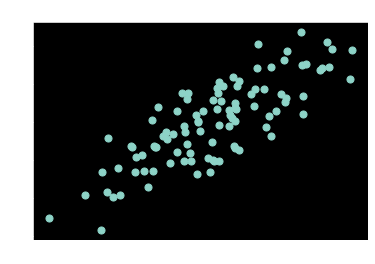

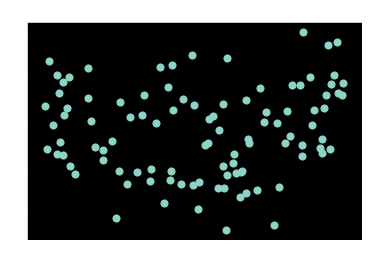

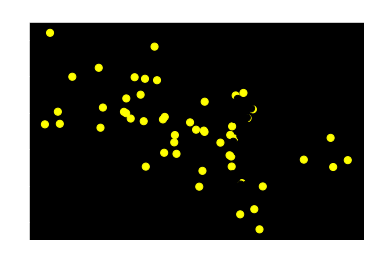

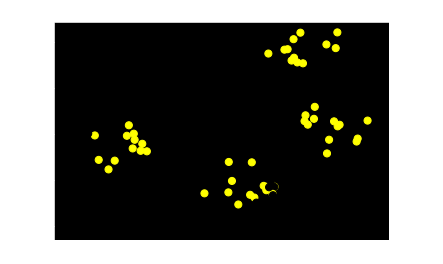

/home/sirivasv/Documents/MCC/MCC-IA/Practicas/utilitarios.py:23: FutureWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#ix-indexer-is-deprecated
  crime = crime.ix[:,columns_to_keep].dropna()
/home/sirivasv/.local/lib/python3.6/site-packages/pandas/core/indexing.py:822: FutureWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#ix-indexer-is-deprecated
  retval = getattr(retval, self.name)._getitem_axis(key, axis=i)
/home/sirivasv/Documents/MCC/MCC-IA/Practicas/utilitarios.py:25: FutureWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#ix-index

In [35]:
from sklearn.datasets import make_classification, make_blobs
from matplotlib.colors import ListedColormap, Colormap
from sklearn.datasets import load_breast_cancer
from utilitarios import load_crime_dataset

cmap_bold = ListedColormap(['#FFFF00', '#00FF00', '#0000FF','#000000'])


# conjunto de datos sintético para regresión simple
from sklearn.datasets import make_regression
plt.figure()
plt.title(u'Ej. de problema de regresión con una variable')
X_R1, y_R1 = make_regression(n_samples = 100, n_features=1,
                            n_informative=1, bias = 150.0,
                            noise = 30, random_state=0)
plt.scatter(X_R1, y_R1, marker= 'o', s=50)
plt.show()


# conjunto de datos sintético para una regresión compleja
from sklearn.datasets import make_friedman1
plt.figure()
plt.title(u'Problema de regresión compleja con una variable')
X_F1, y_F1 = make_friedman1(n_samples = 100,
                           n_features = 7, random_state=0)

plt.scatter(X_F1[:, 2], y_F1, marker= 'o', s=50)
plt.show()

# conjunto de datos sintético para clasificación (binaria)
plt.figure()
plt.title(u'Ej. de problema de clasificación binaria con 2 características')
X_C2, y_C2 = make_classification(n_samples = 100, n_features=2,
                                n_redundant=0, n_informative=2,
                                n_clusters_per_class=1, flip_y = 0.1,
                                class_sep = 0.5, random_state=0)
plt.scatter(X_C2[:, 0], X_C2[:, 1], c=y_C2,
           marker= 'o', s=50, cmap=cmap_bold)
plt.show()


# conjunto de datos sintético más complejo para clasificación (binaria) 
# con clases que no son linealmente separables
X_D2, y_D2 = make_blobs(n_samples = 100, n_features = 2, centers = 8,
                       cluster_std = 1.3, random_state = 4)
y_D2 = y_D2 % 2
plt.figure()
plt.title(u'Ej. de problema de clasif. binaria con clases no separables linealmente')
plt.scatter(X_D2[:,0], X_D2[:,1], c=y_D2,
           marker= 'o', s=50, cmap=cmap_bold)
plt.show()


# Datos de cancer de pecho para clasificación
cancer = load_breast_cancer()
(X_cancer, y_cancer) = load_breast_cancer(return_X_y = True)


# Datos de comunidades y crímenes
(X_crime, y_crime) = load_crime_dataset()

## Modelos lineales para regresión

### Regresión lineal

In [36]:
from sklearn.linear_model import LinearRegression

X_train, X_test, y_train, y_test = train_test_split(X_R1, y_R1,
                                                   random_state = 0)
linreg = LinearRegression().fit(X_train, y_train)

print('coeficiente modelo lineal (w): {}'
     .format(linreg.coef_))
print('intersección en y (b): {:.3f}'
     .format(linreg.intercept_))
print('Coeficiente de determinación R-cuadrado (entrenamiento): {:.3f}'
     .format(linreg.score(X_train, y_train)))
print('Coeficiente de determinación R-cuadrado (prueba): {:.3f}'
     .format(linreg.score(X_test, y_test)))

coeficiente modelo lineal (w): [45.71]
intersección en y (b): 148.446
Coeficiente de determinación R-cuadrado (entrenamiento): 0.679
Coeficiente de determinación R-cuadrado (prueba): 0.492


### Regresión lineal: gráfica ejemplo 

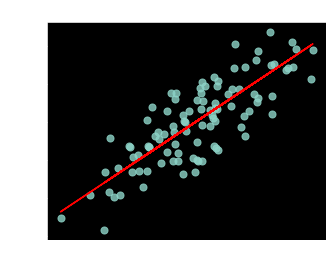

In [37]:
plt.figure(figsize=(5,4))
plt.scatter(X_R1, y_R1, marker= 'o', s=50, alpha=0.8)
plt.plot(X_R1, linreg.coef_ * X_R1 + linreg.intercept_, 'r-')
plt.title(u'Regresión lineal por mínimos-cuadrados')
plt.xlabel(u'Valor de característica (x)')
plt.ylabel('Valor objetivo (y)')
plt.show()

In [38]:
X_train, X_test, y_train, y_test = train_test_split(X_crime, y_crime,
                                                   random_state = 0)
linreg = LinearRegression().fit(X_train, y_train)
print(X_crime.shape)
print('Conjunto de datos de crimen')
print('intersección del modelo lineal: {}'
     .format(linreg.intercept_))
print('coeficiente del modelo lineal:\n{}'
     .format(linreg.coef_))
print('Coeficiente de determinación R-cuadrado (entrenamiento): {:.3f}'
     .format(linreg.score(X_train, y_train)))
print('Coeficiente de determinación R-cuadrado (prueba): {:.3f}'
     .format(linreg.score(X_test, y_test)))

(1994, 88)
Conjunto de datos de crimen
intersección del modelo lineal: -1728.1306725991394
coeficiente del modelo lineal:
[ 1.62e-03 -9.43e+01  1.36e+01 -3.13e+01 -8.15e-02 -1.69e+01 -2.43e-03
  1.53e+00 -1.39e-02 -7.72e+00  2.28e+01 -5.66e+00  9.35e+00  2.07e-01
 -7.43e+00  9.66e-03  4.38e-03  4.80e-03 -4.46e+00 -1.61e+01  8.83e+00
 -5.07e-01 -1.42e+00  8.18e+00 -3.87e+00 -3.54e+00  4.49e+00  9.31e+00
  1.74e+02  1.18e+01  1.51e+02 -3.30e+02 -1.35e+02  6.95e-01 -2.38e+01
  2.77e+00  3.82e-01  4.39e+00 -1.06e+01 -4.92e-03  4.14e+01 -1.16e-03
  1.19e+00  1.75e+00 -3.68e+00  1.60e+00 -8.42e+00 -3.80e+01  4.74e+01
 -2.51e+01 -2.88e-01 -3.66e+01  1.90e+01 -4.53e+01  6.83e+02  1.04e+02
 -3.29e+02 -3.14e+01  2.74e+01  5.12e+00  6.92e+01  1.98e-02 -6.12e-01
  2.65e+01  1.01e+01 -1.59e+00  2.24e+00  7.38e+00 -3.14e+01 -9.78e-05
  5.02e-05 -3.48e-04 -2.50e-04 -5.27e-01 -5.17e-01 -4.10e-01  1.16e-01
  1.46e+00 -3.04e-01  2.44e+00 -3.66e+01  1.41e-01  2.89e-01  1.77e+01
  5.97e-01  1.98e+00 -1.36

### Regresión Ridge

In [39]:
from sklearn.linear_model import Ridge
X_train, X_test, y_train, y_test = train_test_split(X_crime, y_crime,
                                                   random_state = 0)

linridge = Ridge(alpha=20.0).fit(X_train, y_train)

print('Conjunto de datos de crimen')
print('intersección del modelo lineal de regresión Ridge: {}'
     .format(linridge.intercept_))
print('coeficiente del modelo lineal de regresión Ridge:\n{}'
     .format(linridge.coef_))
print('Coeficiente de determinación R-cuadrado (entrenamiento): {:.3f}'
     .format(linridge.score(X_train, y_train)))
print('Coeficiente de determinación R-cuadrado (prueba): {:.3f}'
     .format(linridge.score(X_test, y_test)))
print('Número de características no cero: {}'
     .format(np.sum(linridge.coef_ != 0)))

Conjunto de datos de crimen
intersección del modelo lineal de regresión Ridge: -3352.423035846186
coeficiente del modelo lineal de regresión Ridge:
[ 1.95e-03  2.19e+01  9.56e+00 -3.59e+01  6.36e+00 -1.97e+01 -2.81e-03
  1.66e+00 -6.61e-03 -6.95e+00  1.72e+01 -5.63e+00  8.84e+00  6.79e-01
 -7.34e+00  6.70e-03  9.79e-04  5.01e-03 -4.90e+00 -1.79e+01  9.18e+00
 -1.24e+00  1.22e+00  1.03e+01 -3.78e+00 -3.73e+00  4.75e+00  8.43e+00
  3.09e+01  1.19e+01 -2.05e+00 -3.82e+01  1.85e+01  1.53e+00 -2.20e+01
  2.46e+00  3.29e-01  4.02e+00 -1.13e+01 -4.70e-03  4.27e+01 -1.23e-03
  1.41e+00  9.35e-01 -3.00e+00  1.12e+00 -1.82e+01 -1.55e+01  2.42e+01
 -1.32e+01 -4.20e-01 -3.60e+01  1.30e+01 -2.81e+01  4.39e+01  3.87e+01
 -6.46e+01 -1.64e+01  2.90e+01  4.15e+00  5.34e+01  1.99e-02 -5.47e-01
  1.24e+01  1.04e+01 -1.57e+00  3.16e+00  8.78e+00 -2.95e+01 -2.33e-04
  3.14e-04 -4.14e-04 -1.79e-04 -5.74e-01 -5.18e-01 -4.21e-01  1.53e-01
  1.33e+00  3.85e+00  3.03e+00 -3.78e+01  1.38e-01  3.08e-01  1.57e+01


#### Regresión Ridge con normalización de características

In [40]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()

from sklearn.linear_model import Ridge
X_train, X_test, y_train, y_test = train_test_split(X_crime, y_crime,
                                                   random_state = 0)

X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

linridge = Ridge(alpha=20.0).fit(X_train_scaled, y_train)

print('Conjunto de datos de crimen')
print('intersección del modelo lineal de regresión Ridge: {}'
     .format(linridge.intercept_))
print('coeficiente del modelo lineal de regresión Ridge:\n{}'
     .format(linridge.coef_))
print('Coeficiente de determinación R-cuadrado (entrenamiento): {:.3f}'
     .format(linridge.score(X_train_scaled, y_train)))
print('Coeficiente de determinación R-cuadrado (prueba): {:.3f}'
     .format(linridge.score(X_test_scaled, y_test)))
print('Número de características no cero: {}'
     .format(np.sum(linridge.coef_ != 0)))

Conjunto de datos de crimen
intersección del modelo lineal de regresión Ridge: 933.3906385044157
coeficiente del modelo lineal de regresión Ridge:
[  88.69   16.49  -50.3   -82.91  -65.9    -2.28   87.74  150.95   18.88
  -31.06  -43.14 -189.44   -4.53  107.98  -76.53    2.86   34.95   90.14
   52.46  -62.11  115.02    2.67    6.94   -5.67 -101.55  -36.91   -8.71
   29.12  171.26   99.37   75.07  123.64   95.24 -330.61 -442.3  -284.5
 -258.37   17.66 -101.71  110.65  523.14   24.82    4.87  -30.47   -3.52
   50.58   10.85   18.28   44.11   58.34   67.09  -57.94  116.14   53.81
   49.02   -7.62   55.14  -52.09  123.39   77.13   45.5   184.91  -91.36
    1.08  234.09   10.39   94.72  167.92  -25.14   -1.18   14.6    36.77
   53.2   -78.86   -5.9    26.05  115.15   68.74   68.29   16.53  -97.91
  205.2    75.97   61.38  -79.83   67.27   95.67  -11.88]
Coeficiente de determinación R-cuadrado (entrenamiento): 0.615
Coeficiente de determinación R-cuadrado (prueba): 0.599
Número de caracterís

#### Regresión Ridge con parámetro de regularización alpha

In [41]:
print('Regresión Ridge: efecto del parámetro de regularización alpha\n')
for this_alpha in [0, 1, 10, 20, 50, 100, 1000]:
    linridge = Ridge(alpha = this_alpha).fit(X_train_scaled, y_train)
    r2_train = linridge.score(X_train_scaled, y_train)
    r2_test = linridge.score(X_test_scaled, y_test)
    num_coeff_bigger = np.sum(abs(linridge.coef_) > 1.0)
    print('Alpha = {:.2f}\nnum abs(coef.) > 1.0: {}, \
r-squared entrenamiento: {:.2f}, r-squared prueba: {:.2f}\n'
         .format(this_alpha, num_coeff_bigger, r2_train, r2_test))

Regresión Ridge: efecto del parámetro de regularización alpha

Alpha = 0.00
num abs(coef.) > 1.0: 88, r-squared entrenamiento: 0.67, r-squared prueba: 0.48

Alpha = 1.00
num abs(coef.) > 1.0: 87, r-squared entrenamiento: 0.66, r-squared prueba: 0.56

Alpha = 10.00
num abs(coef.) > 1.0: 87, r-squared entrenamiento: 0.63, r-squared prueba: 0.59

Alpha = 20.00
num abs(coef.) > 1.0: 88, r-squared entrenamiento: 0.61, r-squared prueba: 0.60

Alpha = 50.00
num abs(coef.) > 1.0: 86, r-squared entrenamiento: 0.58, r-squared prueba: 0.58

Alpha = 100.00
num abs(coef.) > 1.0: 87, r-squared entrenamiento: 0.55, r-squared prueba: 0.55

Alpha = 1000.00
num abs(coef.) > 1.0: 84, r-squared entrenamiento: 0.31, r-squared prueba: 0.30



### Regresión Polinomial

In [42]:
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.preprocessing import PolynomialFeatures


X_train, X_test, y_train, y_test = train_test_split(X_F1, y_F1,
                                                   random_state = 0)
linreg = LinearRegression().fit(X_train, y_train)

print('coeficiente modelo lineal (w): {}'
     .format(linreg.coef_))
print('intersección modelo lineal (b): {:.3f}'
     .format(linreg.intercept_))
print('Coeficiente de determinación R-cuadrado (enternamiento): {:.3f}'
     .format(linreg.score(X_train, y_train)))
print('Coeficiente de determinación R-cuadrado (prueba): {:.3f}'
     .format(linreg.score(X_test, y_test)))

print('\nAhora transformamos la entrada de datos original para agregar\n\
características polinomiales hasta grado 2 (cuadráticas)\n')
poly = PolynomialFeatures(degree=2)
X_F1_poly = poly.fit_transform(X_F1)

X_train, X_test, y_train, y_test = train_test_split(X_F1_poly, y_F1,
                                                   random_state = 0)
linreg = LinearRegression().fit(X_train, y_train)

print('coeficiente modelo lineal (poly grado 2) (w):\n{}'
     .format(linreg.coef_))
print('intersección modelo lineal (poly grado 2)(b): {:.3f}'
     .format(linreg.intercept_))
print('Coeficiente de determinación R-cuadrado (enternamiento) (poly deg 2): {:.3f}'
     .format(linreg.score(X_train, y_train)))
print('Coeficiente de determinación R-cuadrado (prueba) (poly deg 2): {:.3f}\n'
     .format(linreg.score(X_test, y_test)))

print('\nAgregar muchas características polinomiales generalmente conduce al\n\
sobreajuste, así que a menudo usamos características polinomiales en combinación\n\
con una regresión que tiene regularización, como Ridge')

X_train, X_test, y_train, y_test = train_test_split(X_F1_poly, y_F1,
                                                   random_state = 0)
linreg = Ridge().fit(X_train, y_train)

print('coeficiente modelo lineal (poly grado 2) (w):\n{}'
     .format(linreg.coef_))
print('intersección modelo lineal (poly grado 2)(b): {:.3f}'
     .format(linreg.intercept_))
print('Coeficiente de determinación R-cuadrado (enternamiento) (poly deg 2): {:.3f}'
     .format(linreg.score(X_train, y_train)))
print('Coeficiente de determinación R-cuadrado (prueba) (poly deg 2): {:.3f}\n'
     .format(linreg.score(X_test, y_test)))

coeficiente modelo lineal (w): [ 4.42  6.    0.53 10.24  6.55 -2.02 -0.32]
intersección modelo lineal (b): 1.543
Coeficiente de determinación R-cuadrado (enternamiento): 0.722
Coeficiente de determinación R-cuadrado (prueba): 0.722

Ahora transformamos la entrada de datos original para agregar
características polinomiales hasta grado 2 (cuadráticas)

coeficiente modelo lineal (poly grado 2) (w):
[ 3.41e-12  1.66e+01  2.67e+01 -2.21e+01  1.24e+01  6.93e+00  1.05e+00
  3.71e+00 -1.34e+01 -5.73e+00  1.62e+00  3.66e+00  5.05e+00 -1.46e+00
  1.95e+00 -1.51e+01  4.87e+00 -2.97e+00 -7.78e+00  5.15e+00 -4.65e+00
  1.84e+01 -2.22e+00  2.17e+00 -1.28e+00  1.88e+00  1.53e-01  5.62e-01
 -8.92e-01 -2.18e+00  1.38e+00 -4.90e+00 -2.24e+00  1.38e+00 -5.52e-01
 -1.09e+00]
intersección modelo lineal (poly grado 2)(b): -3.206
Coeficiente de determinación R-cuadrado (enternamiento) (poly deg 2): 0.969
Coeficiente de determinación R-cuadrado (prueba) (poly deg 2): 0.805


Agregar muchas características pol

## Modelos lineales para clasificación

### Regresión logística

#### Regresión logistica para clasificación binaria sobre el conjunto de datos de frutas usando las características alto y ancho (clase positiva: manzana, clase negativa: otros)

[1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
Una fruta con alto 6 y ancho 8: es una manzana
Una fruta con alto 10 y ancho 7 es: no una manzana
Exactitud del clasificador regresión logística sobre el entrenamiento: 0.77
Exactitud del clasificador regresión logística sobre el conjunto de prueba: 0.73
/home/sirivasv/.local/lib/python3.6/site-packages/sklearn/linear_model/logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


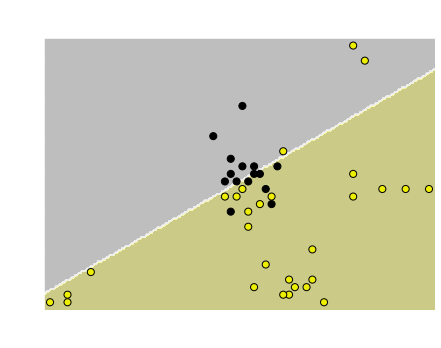

In [43]:
from sklearn.linear_model import LogisticRegression
from utilitarios import (plot_class_regions_for_classifier_subplot)

fig, subaxes = plt.subplots(1, 1, figsize=(7, 5))
y_frutas_apple = [1 if i==1 else 0 for i in y_frutas_2d] # make into a binary problem: apples vs everything else
print(y_frutas_apple)
X_train, X_test, y_train, y_test = (
train_test_split(X_frutas_2d.values,
                y_frutas_apple,
                random_state = 0))

clf = LogisticRegression(C=100).fit(X_train, y_train)
plot_class_regions_for_classifier_subplot(clf, X_train, y_train, None,
                                         None, u'Regresión Logística \
para clasificación binaria\nconjunto de datos de frutas: Manzana vs otros',
                                         subaxes)

h = 6
w = 8
print('Una fruta con alto {} y ancho {}: {}'
     .format(h,w, ['no es una manzana', 'es una manzana'][clf.predict([[h,w]])[0]]))

h = 10
w = 7
print('Una fruta con alto {} y ancho {} es: {}'
     .format(h,w, ['no una manzana', 'una manzana'][clf.predict([[h,w]])[0]]))
subaxes.set_xlabel('alto')
subaxes.set_ylabel('ancho')

print('Exactitud del clasificador regresión logística sobre el entrenamiento: {:.2f}'
     .format(clf.score(X_train, y_train)))
print('Exactitud del clasificador regresión logística sobre el conjunto de prueba: {:.2f}'
     .format(clf.score(X_test, y_test)))

#### Regresión logistica en un conjunto de datos sintéticos simple

/home/sirivasv/.local/lib/python3.6/site-packages/sklearn/linear_model/logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
Exactitud del clasificador regresión logística en el entrenamiento: 0.80
Exactitud del clasificador regresión logística en el conjunto de prueba: 0.80


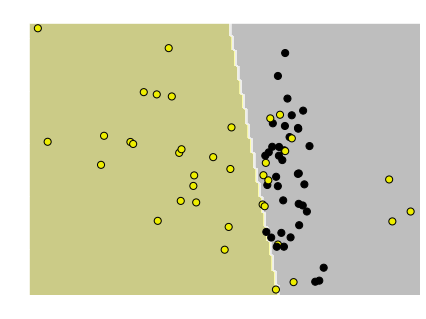

In [44]:
from sklearn.linear_model import LogisticRegression
from utilitarios import (plot_class_regions_for_classifier_subplot)

X_train, X_test, y_train, y_test = train_test_split(X_C2, y_C2,
                                                   random_state = 0)

fig, subaxes = plt.subplots(1, 1, figsize=(7, 5))
clf = LogisticRegression().fit(X_train, y_train)
title = u'Regresión logística, datos sintéticos C = {:.3f}'.format(1.0)
plot_class_regions_for_classifier_subplot(clf, X_train, y_train,
                                         None, None, title, subaxes)

print('Exactitud del clasificador regresión logística en el entrenamiento: {:.2f}'
     .format(clf.score(X_train, y_train)))
print('Exactitud del clasificador regresión logística en el conjunto de prueba: {:.2f}'
     .format(clf.score(X_test, y_test)))


#### Regularización en Regresión Logística: parámetro C

/home/sirivasv/.local/lib/python3.6/site-packages/ipykernel_launcher.py:2: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  
/home/sirivasv/.local/lib/python3.6/site-packages/sklearn/linear_model/logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/home/sirivasv/.local/lib/python3.6/site-packages/sklearn/linear_model/logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/home/sirivasv/.local/lib/python3.6/site-packages/sklearn/linear_model/logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


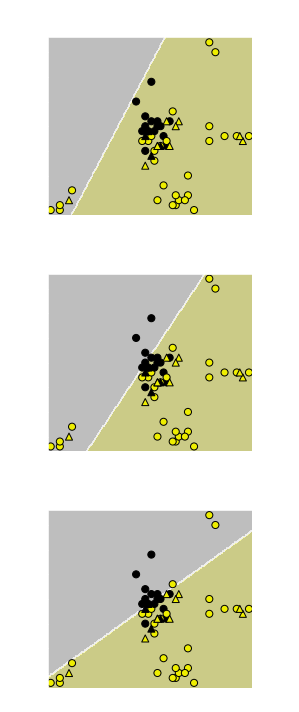

In [45]:
X_train, X_test, y_train, y_test = (
train_test_split(X_frutas_2d.as_matrix(),
                y_frutas_apple,
                random_state=0))

fig, subaxes = plt.subplots(3, 1, figsize=(4, 10))

for this_C, subplot in zip([0.1, 1, 100], subaxes):
    clf = LogisticRegression(C=this_C).fit(X_train, y_train)
    title =u'Regresión Log. (manzana vs otros), C = {:.2f}'.format(this_C)
    
    plot_class_regions_for_classifier_subplot(clf, X_train, y_train,
                                             X_test, y_test, title,
                                             subplot)
plt.tight_layout()

#### Aplicación a un conjunto de datos real

In [46]:
from sklearn.linear_model import LogisticRegression

X_train, X_test, y_train, y_test = train_test_split(X_cancer, y_cancer, random_state = 0)

clf = LogisticRegression().fit(X_train, y_train)
print('Conjunto de datos de cancer de pecho')
print('Exactitud del clasificador regresión logística en el entrenamiento: {:.2f}'
     .format(clf.score(X_train, y_train)))
print('Exactitud del clasificador regresión logística en el conjunto de prueba: {:.2f}'
     .format(clf.score(X_test, y_test)))

Conjunto de datos de cancer de pecho
Exactitud del clasificador regresión logística en el entrenamiento: 0.96
Exactitud del clasificador regresión logística en el conjunto de prueba: 0.96
/home/sirivasv/.local/lib/python3.6/site-packages/sklearn/linear_model/logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


### Máquinas de vectores de soporte

#### Máquina de vectores de soporte lineal

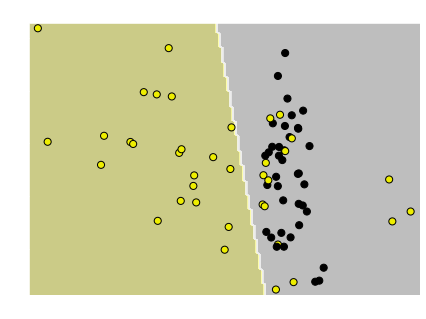

In [47]:
from sklearn.svm import SVC
from utilitarios import plot_class_regions_for_classifier_subplot


X_train, X_test, y_train, y_test = train_test_split(X_C2, y_C2, random_state = 0)

fig, subaxes = plt.subplots(1, 1, figsize=(7, 5))
this_C = 1.0
clf = SVC(kernel = 'linear', C=this_C).fit(X_train, y_train)
title = 'Linear SVC, C = {:.3f}'.format(this_C)
plot_class_regions_for_classifier_subplot(clf, X_train, y_train, None, None, title, subaxes)

#### Máquina de vectores de soporte lineal: parámetro C

/home/sirivasv/.local/lib/python3.6/site-packages/sklearn/svm/base.py:929: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


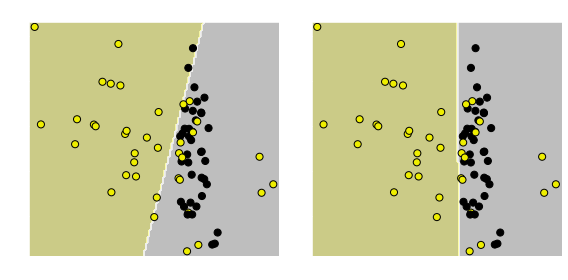

In [48]:
from sklearn.svm import LinearSVC
from utilitarios import plot_class_regions_for_classifier

X_train, X_test, y_train, y_test = train_test_split(X_C2, y_C2, random_state = 0)
fig, subaxes = plt.subplots(1, 2, figsize=(8, 4))

for this_C, subplot in zip([0.00001, 100], subaxes):
    clf = LinearSVC(C=this_C).fit(X_train, y_train)
    title = 'Linear SVC, C = {:.5f}'.format(this_C)
    plot_class_regions_for_classifier_subplot(clf, X_train, y_train,
                                             None, None, title, subplot)
plt.tight_layout()

#### SVM aplicado a datos reales

In [49]:
from sklearn.svm import LinearSVC
X_train, X_test, y_train, y_test = train_test_split(X_cancer, y_cancer, random_state = 0)

clf = LinearSVC().fit(X_train, y_train)
print('Conjunto de datos de cancer de pecho')
print('Exactitud del clasificador SVC en el conjunto de entrenamiento: {:.2f}'
     .format(clf.score(X_train, y_train)))
print('Exactitud del clasificador SVC en el conjunto de: {:.2f}'
     .format(clf.score(X_test, y_test)))

Conjunto de datos de cancer de pecho
Exactitud del clasificador SVC en el conjunto de entrenamiento: 0.92
Exactitud del clasificador SVC en el conjunto de: 0.94
/home/sirivasv/.local/lib/python3.6/site-packages/sklearn/svm/base.py:929: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


### Clasificación multi-clase con modelos lineales

#### LinearSVC con M clases genera M clasificadores uno vs el resto.

In [50]:
from sklearn.svm import LinearSVC

X_train, X_test, y_train, y_test = train_test_split(X_frutas_2d, y_frutas_2d, random_state = 0)

clf = LinearSVC(C=5, random_state = 67).fit(X_train, y_train)
print (clf.score(X_test,y_test))
print('Coeficientes:\n', clf.coef_)
print('Intersecciones:\n', clf.intercept_)

0.4666666666666667
Coeficientes:
 [[-0.26  0.71]
 [-1.63  1.16]
 [ 0.03  0.29]
 [ 1.24 -1.64]]
Intersecciones:
 [-3.29  1.2  -2.72  1.16]
/home/sirivasv/.local/lib/python3.6/site-packages/sklearn/svm/base.py:929: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


## Máquinas de vectores de soporte con kernel

### Clasificación

/home/sirivasv/.local/lib/python3.6/site-packages/sklearn/svm/base.py:193: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)
/home/sirivasv/.local/lib/python3.6/site-packages/sklearn/svm/base.py:193: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)


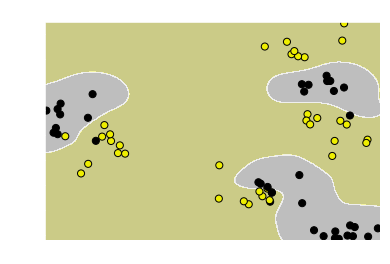

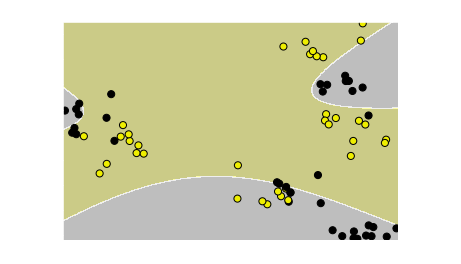

In [51]:
from sklearn.svm import SVC
from utilitarios import plot_class_regions_for_classifier

X_train, X_test, y_train, y_test = train_test_split(X_D2, y_D2, random_state = 0)

# The default SVC kernel is radial basis function (RBF)
plot_class_regions_for_classifier(SVC().fit(X_train, y_train),
                                 X_train, y_train, None, None,
                                 u'Clasificador máquina de vectores de soporte: kernel RBF')

# Compare decision boundries with polynomial kernel, degree = 3
plot_class_regions_for_classifier(SVC(kernel = 'poly', degree = 3)
                                 .fit(X_train, y_train), X_train,
                                 y_train, None, None,
                                 u'Clasificador máquina de vectores de soporte: Kernel polynomial, grado=3')

#### Máquina de vectores de soporte con kernel RBF: parámetro gamma

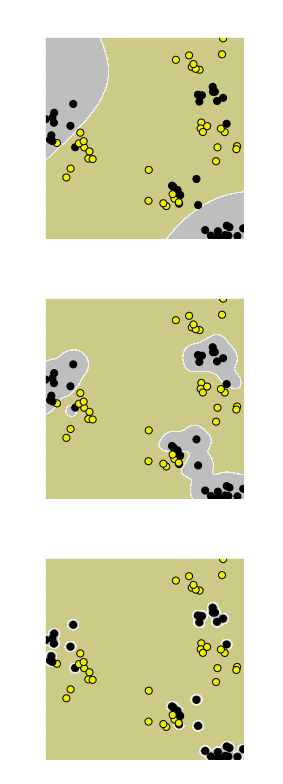

In [52]:
from utilitarios import plot_class_regions_for_classifier

X_train, X_test, y_train, y_test = train_test_split(X_D2, y_D2, random_state = 0)
fig, subaxes = plt.subplots(3, 1, figsize=(4, 11))

for this_gamma, subplot in zip([0.01, 1.0, 10.0], subaxes):
    clf = SVC(kernel = 'rbf', gamma=this_gamma).fit(X_train, y_train)
    title = u'Clasificador máquina de vector de soporte: \nkernel RBF, gamma = {:.2f}'.format(this_gamma)
    plot_class_regions_for_classifier_subplot(clf, X_train, y_train,
                                             None, None, title, subplot)
    plt.tight_layout()

#### Máquina de vector de soporte con kernel RBF: usando ambos parámetros C y gamma 

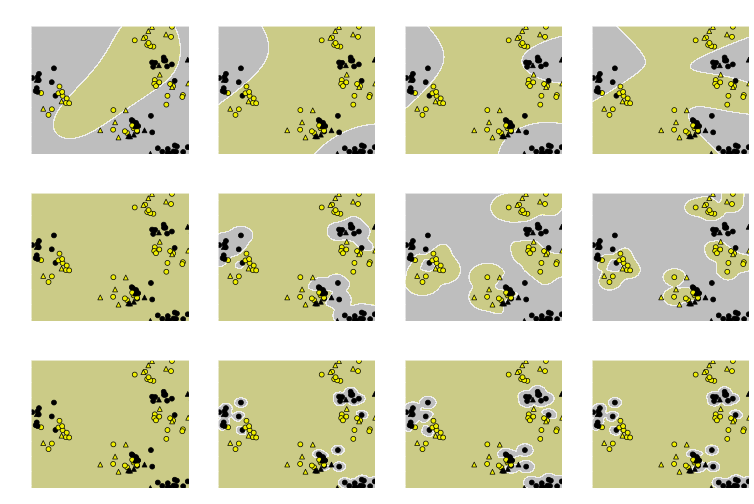

In [53]:
from sklearn.svm import SVC
from utilitarios import plot_class_regions_for_classifier_subplot

from sklearn.model_selection import train_test_split


X_train, X_test, y_train, y_test = train_test_split(X_D2, y_D2, random_state = 0)
fig, subaxes = plt.subplots(3, 4, figsize=(15, 10), dpi=50)

for this_gamma, this_axis in zip([0.01, 1, 5], subaxes):
    
    for this_C, subplot in zip([0.1, 1, 15, 250], this_axis):
        title = 'gamma = {:.2f}, C = {:.2f}'.format(this_gamma, this_C)
        clf = SVC(kernel = 'rbf', gamma = this_gamma,
                 C = this_C).fit(X_train, y_train)
        plot_class_regions_for_classifier_subplot(clf, X_train, y_train,
                                                 X_test, y_test, title,
                                                 subplot)
        plt.tight_layout(pad=0.4, w_pad=0.5, h_pad=1.0)

### Aplicacion de la SVMs en un conjunto de datos reales: datos no normalizados

In [54]:
from sklearn.svm import SVC
X_train, X_test, y_train, y_test = train_test_split(X_cancer, y_cancer,
                                                   random_state = 0)

clf = SVC(C=10).fit(X_train, y_train)
print('Conjunto de datos de cancer (características no normalizados)')
print('Exactitud SVC kernel RBF en el conjunto de entrenamiento: {:.2f}'
     .format(clf.score(X_train, y_train)))
print('Exactitud SVC kernel RBF en el conjunto de prueba: {:.2f}'
     .format(clf.score(X_test, y_test)))

Conjunto de datos de cancer (características no normalizados)
Exactitud SVC kernel RBF en el conjunto de entrenamiento: 1.00
Exactitud SVC kernel RBF en el conjunto de prueba: 0.63
/home/sirivasv/.local/lib/python3.6/site-packages/sklearn/svm/base.py:193: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)


### Aplicacion de la SVMs en un conjunto de datos reales: datos normalizados usando minmax

In [55]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

clf = SVC(C=10).fit(X_train_scaled, y_train)
print('Conjunto de datos de cancer de pecho (normalizados con MinMax)')
print('Exactitud SVC kernel RBF (con MinMax) en el conjunto de entrenamiento: {:.2f}'
     .format(clf.score(X_train_scaled, y_train)))
print('Exactitud SVC kernel RBF (con MinMax) en el conjunto de prueba: {:.2f}'
     .format(clf.score(X_test_scaled, y_test)))

Conjunto de datos de cancer de pecho (normalizados con MinMax)
Exactitud SVC kernel RBF (con MinMax) en el conjunto de entrenamiento: 0.98
Exactitud SVC kernel RBF (con MinMax) en el conjunto de prueba: 0.96
/home/sirivasv/.local/lib/python3.6/site-packages/sklearn/svm/base.py:193: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)


## Árboles de decisión

In [56]:
from sklearn.datasets import load_iris
from sklearn.tree import DecisionTreeClassifier
from utilitarios import plot_decision_tree
from sklearn.model_selection import train_test_split

iris = load_iris()

X_train, X_test, y_train, y_test = train_test_split(iris.data, iris.target, random_state = 3)
clf = DecisionTreeClassifier().fit(X_train, y_train)

print('Exatitud del clasificador de árboles de decisión en conjunto de entrenamiento: {:.2f}'
     .format(clf.score(X_train, y_train)))
print('Exatitud del clasificador de árboles de decisión en conjunto de prueba: {:.2f}'
     .format(clf.score(X_test, y_test)))

Exatitud del clasificador de árboles de decisión en conjunto de entrenamiento: 1.00
Exatitud del clasificador de árboles de decisión en conjunto de prueba: 0.97


#### Definir el parámetro máxima profundidad (max_depth) del árbol de decisión para evidar sobreajuste (overfitting)

In [57]:
clf2 = DecisionTreeClassifier(max_depth = 3).fit(X_train, y_train)

print('Exatitud del clasificador de árboles de decisión en conjunto de entrenamiento: {:.2f}'
     .format(clf2.score(X_train, y_train)))
print('Exatitud del clasificador de árboles de decisión en conjunto de prueba: {:.2f}'
     .format(clf2.score(X_test, y_test)))

Exatitud del clasificador de árboles de decisión en conjunto de entrenamiento: 0.98
Exatitud del clasificador de árboles de decisión en conjunto de prueba: 0.97


#### Visualización de árboles de decisión

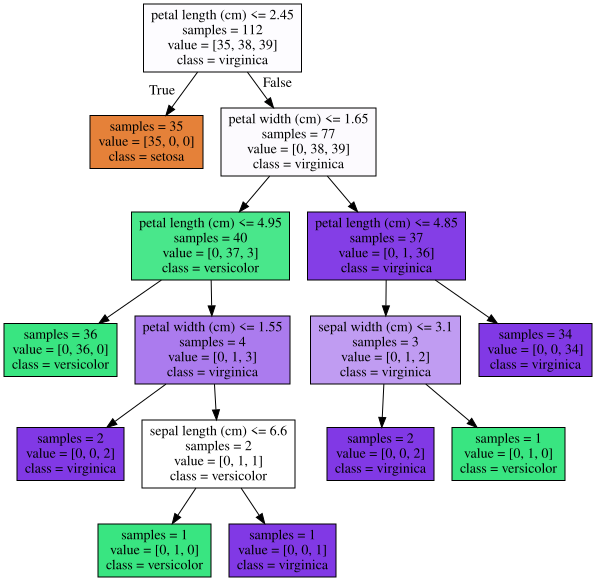

In [58]:
plot_decision_tree(clf, iris.feature_names, iris.target_names)

#### versión pre-podada (max_depth = 3)

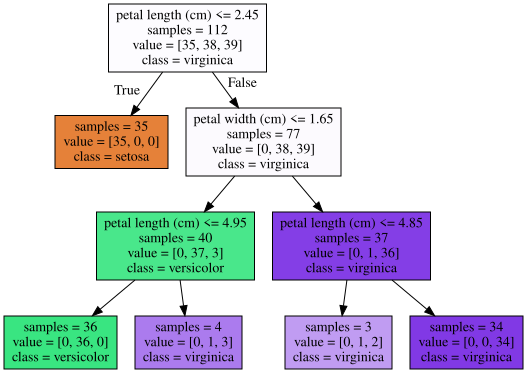

In [59]:
plot_decision_tree(clf2, iris.feature_names, iris.target_names)

#### Importancia de características

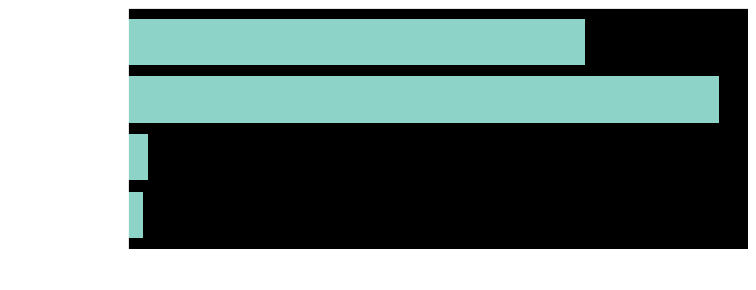

Importancia de características: [0.01 0.02 0.55 0.42]


In [60]:
from utilitarios import plot_feature_importances

plt.figure(figsize=(10,4), dpi=80)
plot_feature_importances(clf, iris.feature_names)
plt.show()

print(u'Importancia de características: {}'.format(clf.feature_importances_))

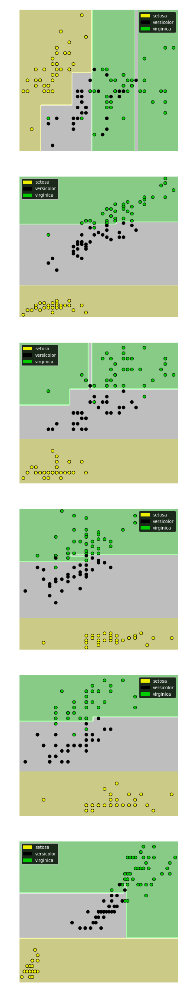

In [61]:
from sklearn.tree import DecisionTreeClassifier
from utilitarios import plot_class_regions_for_classifier_subplot

X_train, X_test, y_train, y_test = train_test_split(iris.data, iris.target, random_state = 0)
fig, subaxes = plt.subplots(6, 1, figsize=(6, 32))

pair_list = [[0,1], [0,2], [0,3], [1,2], [1,3], [2,3]]
tree_max_depth = 4

for pair, axis in zip(pair_list, subaxes):
    X = X_train[:, pair]
    y = y_train
    
    clf = DecisionTreeClassifier(max_depth=tree_max_depth).fit(X, y)
    title = 'Arbol de decision, max_depth = {:d}'.format(tree_max_depth)
    plot_class_regions_for_classifier_subplot(clf, X, y, None,
                                             None, title, axis,
                                             iris.target_names)
    
    axis.set_xlabel(iris.feature_names[pair[0]])
    axis.set_ylabel(iris.feature_names[pair[1]])
    
plt.tight_layout()
plt.show()

#### Árboles de decisión en un conjunto de datos del mundo real

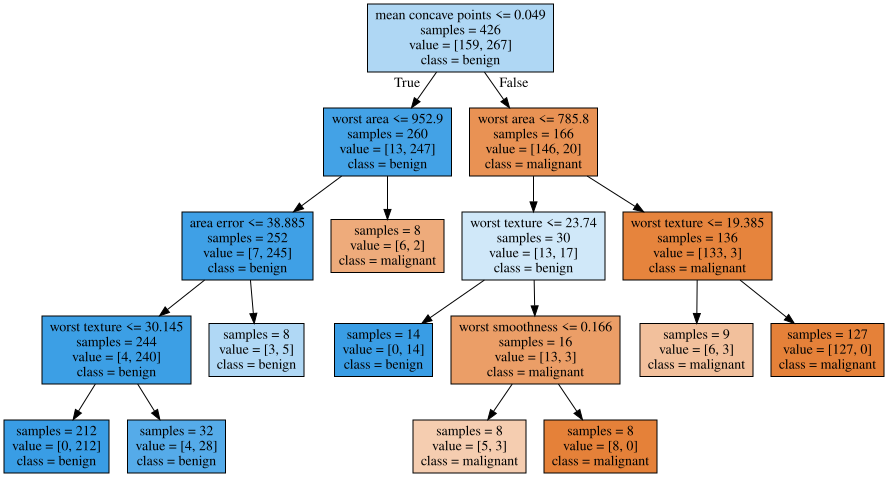

In [62]:
from sklearn.tree import DecisionTreeClassifier
from utilitarios import plot_decision_tree
from utilitarios import plot_feature_importances

X_train, X_test, y_train, y_test = train_test_split(X_cancer, y_cancer, random_state = 0)

clf = DecisionTreeClassifier(max_depth = 4, min_samples_leaf = 8,
                            random_state = 0).fit(X_train, y_train)

plot_decision_tree(clf, cancer.feature_names, cancer.target_names)

Conjunto de datos de cancer de pecho: árbol de decisión
Exactitud del clasificador en el conjunto de entrenamiento: 0.96
Exactitud del clasificador en el conjunto de prueba: 0.94


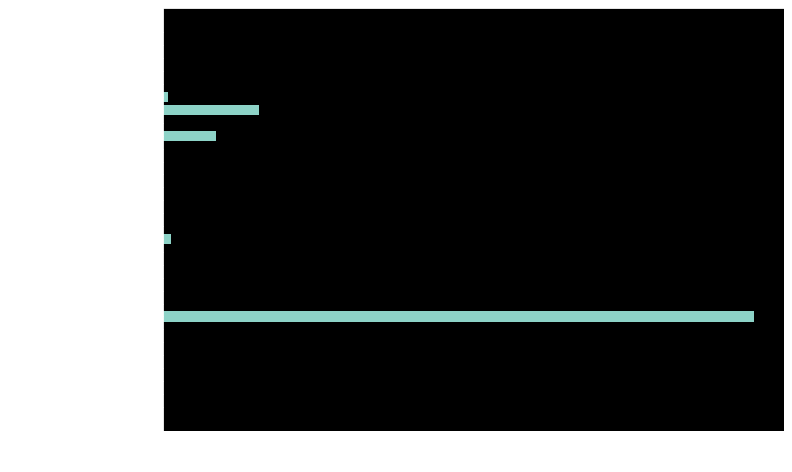

In [63]:
print('Conjunto de datos de cancer de pecho: árbol de decisión')
print('Exactitud del clasificador en el conjunto de entrenamiento: {:.2f}'
     .format(clf.score(X_train, y_train)))
print('Exactitud del clasificador en el conjunto de prueba: {:.2f}'
     .format(clf.score(X_test, y_test)))

plt.figure(figsize=(10,6),dpi=80)
plot_feature_importances(clf, cancer.feature_names)
plt.tight_layout()

plt.show()

## Clasificadores Bayes Ingenuo

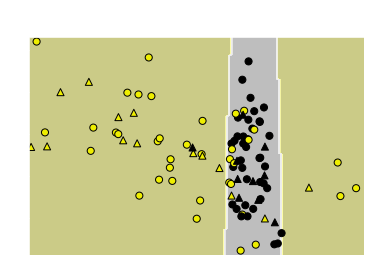

In [64]:
from sklearn.naive_bayes import GaussianNB
from utilitarios import plot_class_regions_for_classifier

X_train, X_test, y_train, y_test = train_test_split(X_C2, y_C2, random_state=0)

nbclf = GaussianNB().fit(X_train, y_train)
plot_class_regions_for_classifier(nbclf, X_train, y_train, X_test, y_test,
                                 'Bayes ingenuo gausiano: Conjunto 1')

### Aplicación a un conjunto del mundo real

In [65]:
X_train, X_test, y_train, y_test = train_test_split(X_cancer, y_cancer, random_state = 0)

nbclf = GaussianNB().fit(X_train, y_train)
print('Conjunto de datos de cancer de pecho')
print('Exactitud del clasificador GaussianNB en el conjunto de entrenamiento: {:.2f}'
     .format(nbclf.score(X_train, y_train)))
print('Exactitud del clasificador GaussianNB en el conjunto de prueba: {:.2f}'
     .format(nbclf.score(X_test, y_test)))

Conjunto de datos de cancer de pecho
Exactitud del clasificador GaussianNB en el conjunto de entrenamiento: 0.95
Exactitud del clasificador GaussianNB en el conjunto de prueba: 0.94


## Validación cruzada

### Ejemplo con el clasificador k-NN con el conjunto de datos de frutas (2 características)

In [66]:
from sklearn.model_selection import cross_val_score

clf = KNeighborsClassifier(n_neighbors = 5)
X = X_frutas_2d#.as_matrix()
print (type(X))
y = y_frutas_2d.values
cv_scores = cross_val_score(clf, X, y,cv=5)
print('Puntajes de validacion cruzadas (3-capas):', cv_scores)
print('Promedio de puntajes validación cruzada (3-capas): {:.3f}'
     .format(np.mean(cv_scores)))

<class 'pandas.core.frame.DataFrame'>
Puntajes de validacion cruzadas (3-capas): [0.85 0.75 0.83 0.83 0.8 ]
Promedio de puntajes validación cruzada (3-capas): 0.813
